# GPS ANALYSIS FOR EXPENSIVE AND CHEAP PROPERTIES

## VISUALIZATION

In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [3]:
train = pd.read_csv('./data/cleaned/train_cleaned_imputated.csv')
test = pd.read_csv('./data/cleaned/test_cleaned_imputed.csv')

We do it only with samples because is really computationally expensive

#### From this visual inspection I have to question to answer:

#### 1) Is distance to shore importante for price values?
#### 2) There is any pattern/cluster in the high valued properties locations? 

## FEATURE ENGINEERING

# QUESTION 1: IS DISTANCE TO SHORE IMPORTANT FOR PRICE?
### CALCULATING DISTANCE TO COASTLINE

https://gis.stackexchange.com/questions/426828/find-minimum-distance-to-us-coastline-in-python

http://www.naturalearthdata.com/downloads/10m-physical-vectors/

With this code we are gonna calculate distance beetween two points in a sphere with the Haversine method:

https://www.geeksforgeeks.org/haversine-formula-to-find-distance-between-two-points-on-a-sphere/

First we download from http://www.naturalearthdata.com/downloads/10m-physical-vectors/ date from coastline from all the world. 

It is specifically divided by country so we can focus only on Colombia shores. 

When with CalculateCoastDistance we iterate over all values and get the distance in kilometers and save it in a dataframe and CSV for further analysis. 

It can take ~ 20-60 mins depending on CPU specs

### WARNING: CAN TAKE 60~80MINS IN HIGH END CPU
### GO TO NEXT QUESTION AND LOAD CSV WITH DATA ALREADY PROCESSED

### TRAIN SET

In [7]:
import geopandas as gpd
from shapely.geometry import Point

def min_distance(point, lines):
    return lines.distance(point).min()

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
colombia = world[world['name']=='Colombia'].dissolve(by='name')
coastline = gpd.clip(gpd.read_file('./coastline/ne_10m_coastline.shp'), colombia).to_crs('EPSG:3087')

def CalculateCoastDistance(lat, lon):
    points_df = gpd.GeoDataFrame({
        'geometry': [
            Point(lon, lat)]
            }, crs='EPSG:4326')
    points_df = points_df.to_crs('EPSG:3087') # https://epsg.io/3087

    points_df['min_dist_to_coast'] = points_df.geometry.apply(min_distance, args=(coastline,))
    return points_df['min_dist_to_coast']/1000

In [ ]:
train['coast_dist'] = train.apply(lambda x: CalculateCoastDistance(x['lat'], x['lon']), axis=1)

Make a backup of distances cause is really a hard task to compute

In [ ]:
train['coast_dist'].to_csv('./data/distances_train.csv')

### TEST SET

In [13]:
test['coast_dist'] = test.apply(lambda x: CalculateCoastDistance(x['lat'], x['lon']), axis=1)

Make a backup of distances cause is really a hard task to compute

In [14]:
test['coast_dist'].to_csv('./data/distances_test.csv')

# QUESTION 2: CLUSTERING EXPENSIVE AREAS IS WORTHY?
Like any country or place, we have expensive neighborhoods and expensive regions. And viceversa. 

https://stackoverflow.com/questions/60184676/python-coordinates-density-mean

https://levelup.gitconnected.com/clustering-gps-co-ordinates-forming-regions-4f50caa7e4a1

IN CASE YOU DON'T WANT TO RUN ALL OF THE ABOVE JUST LOAD THE NEXT CELL

In [4]:
#train = pd.read_csv('./data/cleaned/train_cleaned_imputated.csv')
#test = pd.read_csv('./data/cleaned/test_cleaned_imputed.csv')

#train['coast_dist'] = pd.read_csv('./data/distances_train.csv')['coast_dist']
#test['coast_dist'] = pd.read_csv('./data/distances_test.csv')['coast_dist']

### K-MEANS

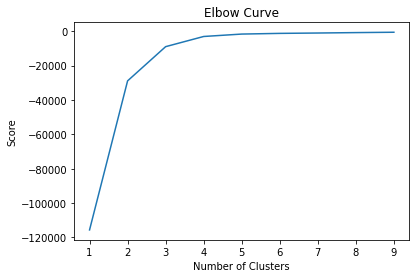

In [5]:
from sklearn.cluster import KMeans
K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = train.loc[train['target'] == 1,'lat'].values.reshape(-1,1)
X_axis = train.loc[train['target'] == 1,'lon'].values
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

Despite the elbow method suggesting 3 clusters as a proper number of cluster centers, as we analize in the map, it's better to get clusters that matches the 4 major Colombian's cities. 

In [6]:
train['expensive_area'] = 99

kmeans = KMeans(n_clusters = 4, init ='k-means++')

kmeans.fit(train.loc[train['target']==1,['lat','lon']]) # Compute k-means clustering.

train.loc[train['target']==1,'expensive_area'] = kmeans.fit_predict(train.loc[train['target']==1,['lat','lon']])

centers = kmeans.cluster_centers_ # Coordinates of cluster centers.

labels = kmeans.predict(train.loc[train['target']==1,['lat','lon']]) # Labels of each point

train.head(10)

,Unnamed: 0,start_date,lat,lon,l2,l3,surface_total,property_type,target,pileta,...,balcon,cancha,gimnasio,sauna,a_estrenar,bathrooms_cat,bedrooms_cat,days_published,coast_dist,expensive_area
0,0,2020-12-14,6.203000,-75.572000,Antioquia,Medellín,9.000000e+02,Casa,1,1,...,1,1,1,0,0,4,4,58.565894,201.511693,2
1,1,2020-09-16,4.722748,-74.073115,Cundinamarca,Bogotá D.C,1.220000e+02,Apartamento,0,1,...,0,1,1,0,0,1,1,240.000000,361.444532,99
2,2,2020-08-19,4.709000,-74.030000,Cundinamarca,Bogotá D.C,1.275906e+07,Casa,0,0,...,1,1,0,0,0,4,4,1.000000,366.137196,99
3,3,2020-11-23,7.119349,-73.122742,Santander,Bucaramanga,2.710000e+02,Otro,1,0,...,0,0,0,0,0,1,0,7.000000,379.270999,0
4,4,2020-10-06,6.247638,-75.565815,Antioquia,Medellín,1.275906e+07,Apartamento,0,1,...,1,0,0,0,0,4,4,1.000000,203.238519,99
5,5,2020-12-17,5.049009,-75.506802,Caldas,Manizales,1.275906e+07,Apartamento,0,0,...,0,1,0,0,0,1,0,77.000000,210.531129,99
6,6,2020-09-13,4.732379,-74.082150,Cundinamarca,Bogotá D.C,1.275906e+07,Casa,1,0,...,0,0,0,0,0,2,0,11.000000,360.616605,0
7,7,2020-11-27,10.990806,-74.821082,Atlántico,Barranquilla,1.275906e+07,Apartamento,0,0,...,0,0,0,0,0,4,0,91.000000,7.702509,99
8,8,2020-09-25,10.977000,-74.809000,Atlántico,Barranquilla,1.275906e+07,Apartamento,0,0,...,0,0,0,0,0,4,4,0.000000,9.703519,99
9,9,2020-08-18,11.004107,-74.806981,Atlántico,Barranquilla,1.890000e+02,Apartamento,0,1,...,0,1,1,1,0,4,4,7.000000,7.556388,99


In [17]:
sample = train.sample(10000, random_state=999)

map_prices_2 = folium.Map(location=[6.243025, -75.577305], tiles='cartodbpositron', zoom_start=6)

# Add a heatmap to the base map
HeatMap(data=sample[['lat', 'lon']], radius=10).add_to(map_prices_2)

def color_producer(val):
    if val == 99:
        return 'green'
    elif val == 0:
        return 'blue'
    elif val == 1:
        return 'red'
    elif val == 2:
        return 'pink'
    else:
        return 'yellow'

for i in range(0,sample.shape[0]):
    folium.Circle(
        location=[sample.iloc[i]['lat'], sample.iloc[i]['lon']],
        radius=3,
        color=color_producer(sample.iloc[i]['expensive_area'])).add_to(map_prices_2)

map_prices_2

<img src="https://github.com/maicobernal/datathon-henry-lab2/blob/main/images/mapaclusteres.png" width="600">

### GREEN = cheap sales - Rest of the colors are Kmeans labels
### A quick view in Google Maps labels this color areas as big cities in Colombia.
<img src="https://github.com/maicobernal/datathon-henry-lab2/blob/main/images/map.png" width="600">

We can confirm these in [Wikipedia](https://es.wikipedia.org/wiki/Anexo:Municipios_de_Colombia_por_poblaci%C3%B3n):

<img src="https://github.com/maicobernal/datathon-henry-lab2/blob/main/images/wikipedia.png" width="700">


### HIEARCHICAL CLUSTERING

Now let's try with another clustering method.

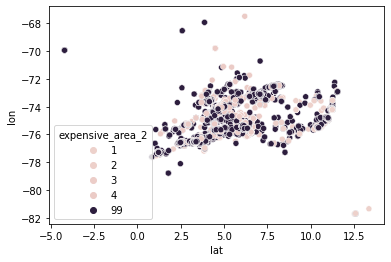

In [7]:
train['expensive_area_2'] = 99

import seaborn as sns

# Import linkage and fcluster functions
from scipy.cluster.hierarchy import fcluster, linkage

# Use the linkage() function to compute distance
Z = linkage(train.loc[train['target']==1,['lat','lon']], 'ward')

# Generate cluster labels
train.loc[train['target']==1,'expensive_area_2'] = fcluster(Z, 4, criterion='maxclust')

# Plot the points with seaborn
sns.scatterplot(x='lat', y='lon', hue='expensive_area_2', data=train)
plt.show()

In [19]:
sample = train.sample(10000, random_state=999)

map_prices_3 = folium.Map(location=[6.243025, -75.577305], tiles='cartodbpositron', zoom_start=6)

# Add a heatmap to the base map
HeatMap(data=sample[['lat', 'lon']], radius=10).add_to(map_prices_3)

def color_producer(val):
    if val == 99:
        return 'green'
    elif val == 1:
        return 'blue'
    elif val == 2:
        return 'red'
    elif val == 3:
        return 'pink'
    else:
        return 'yellow'

for i in range(0,sample.shape[0]):
    folium.Circle(
        location=[sample.iloc[i]['lat'], sample.iloc[i]['lon']],
        radius=3,
        color=color_producer(sample.iloc[i]['expensive_area_2'])).add_to(map_prices_3)

map_prices_3

## HANDS ON FINAL CALCULATIONS

Despite being a subjective visualization of the colors points in the map, trying with diferent methods for cluster proximity (centroid, ward, average, median) doesn't fit well with these areas. 

For that reason we are gonna keep with the Kmeans clustering

Because we don't have the target data for our database, we are gonna calculate distance from centroids to each point

This is gonna be computationally expensive. We will try to do it locally because all API's are paid

https://rapidapi.com/010pixel/api/distance/

In [8]:
print(centers)

[[  4.9386136  -73.97164234]
 [ 10.82063155 -74.96557996]
 [  5.81529571 -75.56161997]
 [  3.38073933 -76.48190203]]


In [9]:
from geopy.distance import geodesic

train['d1'] = train.apply(lambda row: geodesic((row['lat'], row['lon']),(centers[0][0], centers[0][1])).km, axis=1)
train['d2'] = train.apply(lambda row: geodesic((row['lat'], row['lon']),(centers[1][0], centers[1][1])).km, axis=1)
train['d3'] = train.apply(lambda row: geodesic((row['lat'], row['lon']),(centers[2][0], centers[2][1])).km, axis=1)
train['d4'] = train.apply(lambda row: geodesic((row['lat'], row['lon']),(centers[3][0], centers[3][1])).km, axis=1)

In [10]:
test['d1'] = test.apply(lambda row: geodesic((row['lat'], row['lon']),(centers[0][0], centers[0][1])).km, axis=1)
test['d2'] = test.apply(lambda row: geodesic((row['lat'], row['lon']),(centers[1][0], centers[1][1])).km, axis=1)
test['d3'] = test.apply(lambda row: geodesic((row['lat'], row['lon']),(centers[2][0], centers[2][1])).km, axis=1)
test['d4'] = test.apply(lambda row: geodesic((row['lat'], row['lon']),(centers[3][0], centers[3][1])).km, axis=1)

In [11]:
train[['d1','d2','d3','d4']] = train[['d1','d2','d3','d4']].round(2)
train[['d1','d2','d3','d4']].to_csv('./data/train_km_clusters.csv', index=False)

In [12]:
test[['d1','d2','d3','d4']] = test[['d1','d2','d3','d4']].round(2)
test[['d1','d2','d3','d4']].to_csv('./data/test_km_clusters.csv', index=False)

In [25]:
train.set_index('Unnamed: 0', inplace=True)
test.set_index('Unnamed: 0', inplace=True)

In [26]:
train.columns

Index(['start_date', 'lat', 'lon', 'l2', 'l3', 'surface_total',
       'property_type', 'target', 'pileta', 'vigilancia', 'patio', 'garage',
       'balcon', 'cancha', 'gimnasio', 'sauna', 'a_estrenar', 'bathrooms_cat',
       'bedrooms_cat', 'days_published', 'coast_dist', 'expensive_area',
       'expensive_area_2', 'd1', 'd2', 'd3', 'd4'],
      dtype='object')

In [27]:
train.drop(['expensive_area','expensive_area_2'], axis=1, inplace=True)

In [28]:
train.shape

(111372, 25)

In [29]:
test.shape

(65850, 24)

In [30]:
train.to_csv('./data/cleaned/train_final_v2.csv')
test.to_csv('./data/cleaned/test_final_v2.csv')

NOW WE COMPLETED ALL THE NECCESARY FEATURE ENGINEERING (at least for now)

LET'S TRY SOME MACHINE LEARNING MODELS

## CONTINUE IN NOTEBOOK 4